# Simulation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import abtem
import ase

## Build atomic potential using Atomic Simulation Environment (ASE)

* <span style="font-size:20px;">Build model:</span>
    - <span style="font-size:18px;">Import model: ase.io.read('file_name')</span>
    - <span style="font-size:18px;">Transition metal dichalcogenide (TMDC): ase.build.mx2()</span>
    - <span style="font-size:18px;">Graphene: ase.build.graphene()</span>
    - <span style="font-size:18px;">......</span>
* <span style="font-size:20px;">Orthogonalize and cut the model to a square to do simulation.</span>
    - <span style="font-size:18px;">abtem builds probe with the same dimension as the atomic potential, so using square potential to do 4D-STEM simulation can get square Ronchigrams, which is more convenient for post processing.</span>

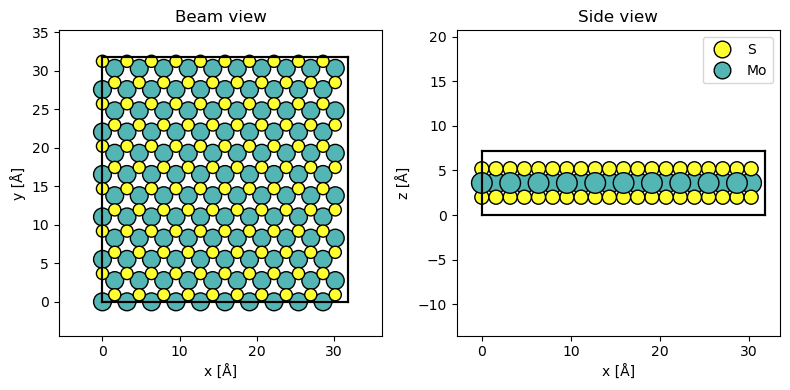

In [2]:
atoms = ase.build.mx2("MoS2", vacuum=2) # vacuum: additional extent at z direction
atoms = abtem.orthogonalize_cell(atoms) * (10, 6, 1) # build supercell
new_atoms = abtem.atoms.cut_cell(atoms, cell=[np.min((atoms.cell[0,0],atoms.cell[1,1])), 
                                              np.min((atoms.cell[0,0],atoms.cell[1,1])), 
                                              atoms.cell[2,2]]) # crop to a square model

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))
abtem.show_atoms(new_atoms, ax=ax1, title="Beam view")
abtem.show_atoms(new_atoms, plane="xz", ax=ax2, title="Side view", legend=True)
fig.tight_layout()

[########################################] | 100% Completed | 327.21 ms


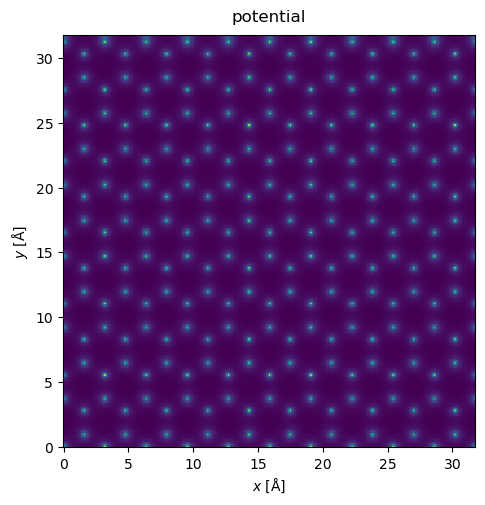

In [3]:
potential = abtem.Potential(
    new_atoms,
    sampling=0.1,
    device="cpu",
    projection="infinite",
    parametrization="kirkland",
)

potential.project().show(cmap='viridis', title="potential")

## Initialize probe

* <span style="font-size:20px;">Parameters:</span>
    - <span style="font-size:18px;">aperture size (semiangle cutoff, mrad)</span>
    - <span style="font-size:18px;">energy (voltages)</span>
    - <span style="font-size:18px;">aberrations (angstrom)</span>

[########################################] | 100% Completed | 106.14 ms


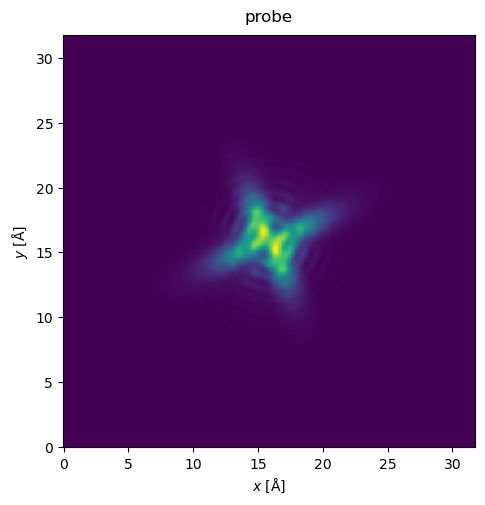

In [4]:
energy = 80e3 # voltages
semiangle_cutoff = 25 # mrad
defocus = 100 # angstrom
aberrations = {"C10": defocus,
               "C12": 20, "phi12": -0.5, 
               "C21": 50, "phi21": 0.1,
               "C23": 100, "phi23": 0.4,
               "C30": 2e5, 
               "C32": 1e5, "phi32": 0.9,
               "C34": 1e5, "phi34": 0.4,
              }

probe = abtem.Probe(
    semiangle_cutoff=semiangle_cutoff,
    energy=energy,
    **aberrations,
    device="cpu",
)

probe.match_grid(potential)

probe.show(cmap='viridis', title="probe")

## Annular dark field (ADF) image simulation

* <span style="font-size:20px;">Parameters:</span>
    - <span style="font-size:18px;">inner angle, outer angle (mrad)</span>
    - <span style="font-size:18px;">scan step size (angstrom)</span>
    - <span style="font-size:18px;">scan pixel number</span>

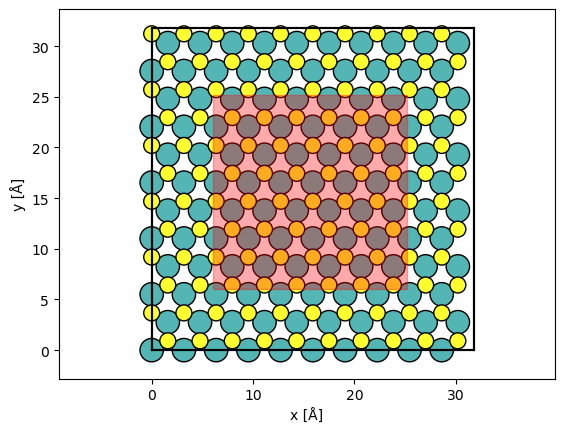

In [5]:
inner_angle, outer_angle = (70, 200)
scan_step_size = 0.3 # angstrom
scan_pixels = 64
scan_start = [6, 6]
scan_end = [scan_start[0] + scan_step_size*scan_pixels, scan_start[1] + scan_step_size*scan_pixels]

gridscan = abtem.GridScan(
    start=scan_start, 
    end=scan_end,
    # fractional=True,
    potential=potential,
    sampling=scan_step_size,
)

adf = abtem.AnnularDetector(inner=inner_angle, outer=outer_angle)
adf_measurements = probe.scan(
    potential,
    scan=gridscan,
    detectors=adf
)

fig, ax = abtem.show_atoms(new_atoms)
gridscan.add_to_plot(ax)

[########################################] | 100% Completed | 39.76 s


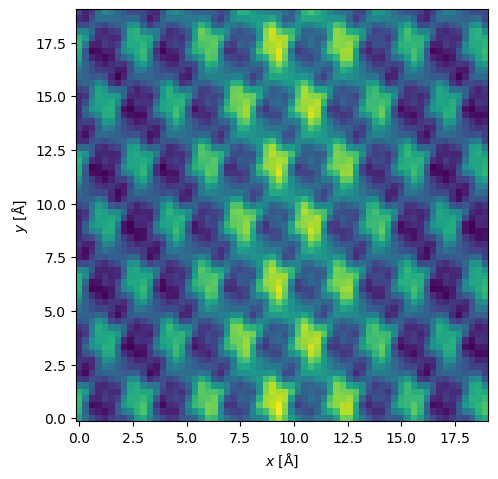

In [6]:
adf_measurements.compute()
adf_measurements.show()

## Simulate 4D dataset

* <span style="font-size:20px;">Parameters:</span>
    - <span style="font-size:18px;">maximum scattering angle (mrad)</span>
    - <span style="font-size:18px;">scan step size (angstrom)</span>
    - <span style="font-size:18px;">scan pixel number</span>

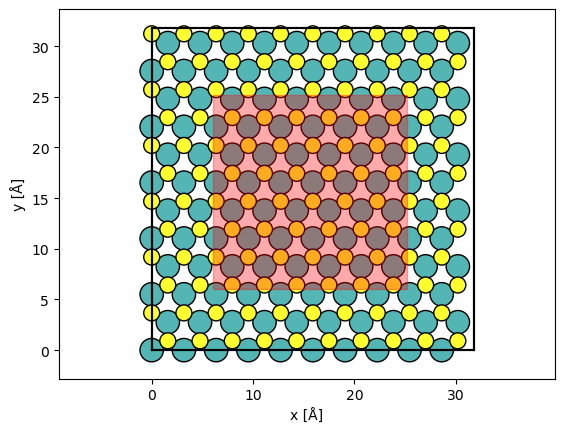

In [7]:
maximum_scattering_angle_mrad = 80 # mrad
scan_step_size = 0.3 # angstrom
scan_pixels = 64
scan_start = [6, 6]
scan_end = [scan_start[0] + scan_step_size*scan_pixels, scan_start[1] + scan_step_size*scan_pixels]

pixelated_detector = abtem.PixelatedDetector(max_angle=maximum_scattering_angle_mrad)

gridscan = abtem.GridScan(
    start=scan_start, 
    end=scan_end,
    # fractional=True,
    potential=potential,
    sampling=scan_step_size,
)

fig, ax = abtem.show_atoms(new_atoms)
gridscan.add_to_plot(ax)

[########################################] | 100% Completed | 40.19 s


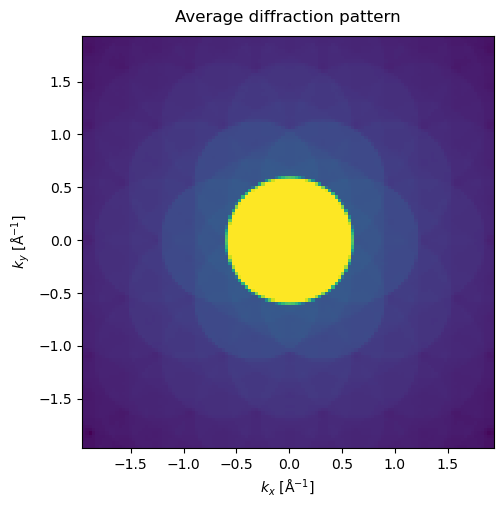

In [8]:
# Simulation
diffraction_patterns = probe.scan(potential, 
                                  scan=gridscan, 
                                  detectors=pixelated_detector,
                                  )
diffraction_patterns.compute()
diffraction_patterns.mean((0,1)).show(power=0.25, title='Average diffraction pattern', cmap='viridis')

In [23]:
# Saving dataset
data_dict = {
    'data_4D': np.float32(diffraction_patterns.array),
    'scan_step_size': scan_step_size,
    'aperture_size': semiangle_cutoff/1e3,
    'voltage': energy/1e3,
    'dose': 'infinity'
}
filename = f'MoS2_{int(energy/1000)}kV_{int(semiangle_cutoff)}mrad_noise free.npy'
np.save(filename, data_dict)

### Visualize 4D dataset

In [9]:
from STEM4D import *
%matplotlib widget

In [10]:
parfile = {'aperture': semiangle_cutoff/1e3, 
           'voltage': energy/1e3, 
           'stepsize': scan_step_size, 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=diffraction_patterns.array)
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

In [11]:
plt.close('all')
%matplotlib inline

## Apply Poisson noise

<span style="font-size:20px;">
    We apply Poisson noise to simulate the limit-dose imaging.<br>
    Poisson distribution $Pr(X=n|_{n=0,1,2,......})=\frac{\lambda^n}{n!}e^{-\lambda}  $ represents the properbility of how many times that an event might happen. <br>
    $E(X)=\lambda$, so the number of electrons for each scan position should be $\lambda$. 
</span>

In [12]:
# unit here is electrons per square angstrom e/A^2
dose = 1e4

### Noised ADF iamge

<span style="font-size:20px;">
    The number of electrons for each scan position is $\lambda$, but there are less electrons scattered to ADF detector. <br>
    $\Rightarrow\lambda_{ADF}=\lambda\times \frac{\text{ADF intensity}}{\text{probe intensity}}$
</span>

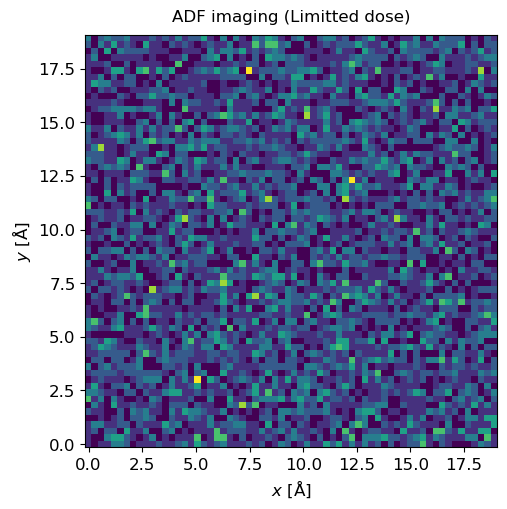

In [13]:
# Apply poisson noise to ADF image
adf_noise = adf_measurements.poisson_noise(dose)
adf_noise.show(title='ADF imaging (Limitted dose)')

In [22]:
# Saving ADF image
data_dict = {
    'image': np.float32(adf_noise.array),
    'scan_step_size': scan_step_size,
    'aperture_size': semiangle_cutoff/1e3,
    'voltage': energy/1e3,
    'dose': dose
}
filename = f'MoS2_ADF_{int(energy/1000)}kV_{int(semiangle_cutoff)}mrad_dose {int(dose)}.npy'
np.save(filename, data_dict)

### Noised 4D dataset

<span style="font-size:20px;">
    Most electrons are scattered to the pixelated detector. <br>
    $\Rightarrow\lambda_{4D}\approx\lambda$
</span>

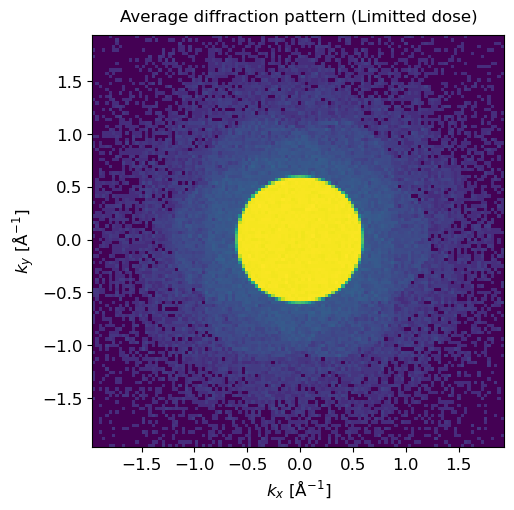

In [15]:
# Apply poisson noise to CBED patterns
diff_patts_noise = diffraction_patterns.poisson_noise(dose)
diff_patts_noise.mean((0,1)).show(power=0.25,
                                  title='Average diffraction pattern (Limitted dose)', 
                                  cmap='viridis')
data_4D = diff_patts_noise.array

In [16]:
print(f'dataset size:\t {data_4D.shape}')
print(f'scan step size:\t {scan_step_size} A')
print(f'aperture size:\t {int(semiangle_cutoff)} mrad')
print(f'voltage:\t {int(energy/1000)} keV')
print(f'dose:\t\t {int(dose)} e/A^2')

dataset size:	 (64, 64, 124, 124)
scan step size:	 0.3 A
aperture size:	 25 mrad
voltage:	 80 keV
dose:		 10000 e/A^2


In [17]:
# Saving dataset
data_dict = {
    'data_4D': np.float32(diff_patts_noise.array),
    'scan_step_size': scan_step_size,
    'aperture_size': semiangle_cutoff/1e3,
    'voltage': energy/1e3,
    'dose': dose
}
filename = f'MoS2_{int(energy/1000)}kV_{int(semiangle_cutoff)}mrad_dose {int(dose)}.npy'
np.save(filename, data_dict)

#### Visualize 4D dataset

In [18]:
from STEM4D import *
%matplotlib widget

In [19]:
parfile = {'aperture': semiangle_cutoff/1e3, 
           'voltage': energy/1e3, 
           'stepsize': scan_step_size, 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=diff_patts_noise.array)
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

# Single side-band (SSB) ptychography

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from STEM4D import *
%matplotlib qt5

## SSB reconstruction

<span style="font-size:20px;">
    The Fourier transformation of the simulated (or experimental) dataset:<br>
    $G(\mathbf{K, Q})=\mathcal{F}\{I(\mathbf{K, R_p})\}$<br>
    <img src="ssb equation interpretation.png" width="1000"/>
</span>

In [26]:
filename = 'MoS2_80kV_25mrad_aberration free_noise free.npy'
filename = 'MoS2_80kV_25mrad_noise free.npy' 
data = np.load(filename, allow_pickle=True).item()
parfile = {'aperture': data['aperture_size'], 
           'voltage': data['voltage'], 
           'stepsize': data['scan_step_size'], 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=data['data_4D'])
# data_4D.bin_Q(bin_factor=2)
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

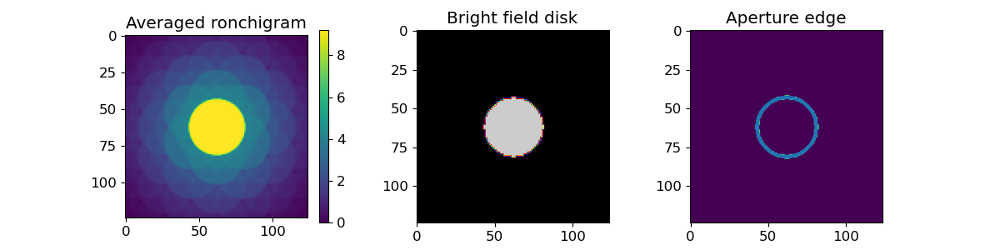

In [27]:
data_4D.plot_aperture()

In [28]:
data_4D.truncate_ronchigram(expansion_ratio=None)
data_4D.apply_FT()
data_4D.plot_4D_reciprocal_both()

The module://ipympl.backend_nbagg matplotlib backend is not compatible with the traitsui GUI elements. For more information, read http://hyperspy.readthedocs.io/en/stable/user_guide/getting_started.html#possible-warnings-when-importing-hyperspy.


<Signal2D, title: FT of 4D data, dimensions: (64, 64, 2|124, 124)>

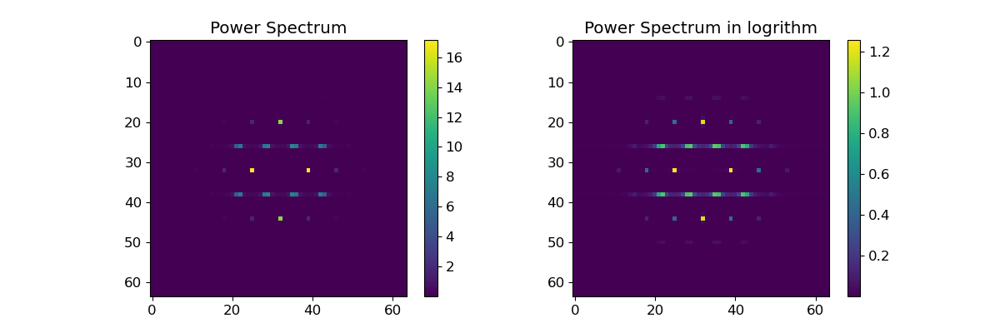

In [30]:
data_4D.remove_zero_frequency()
data_4D.plot_FT()

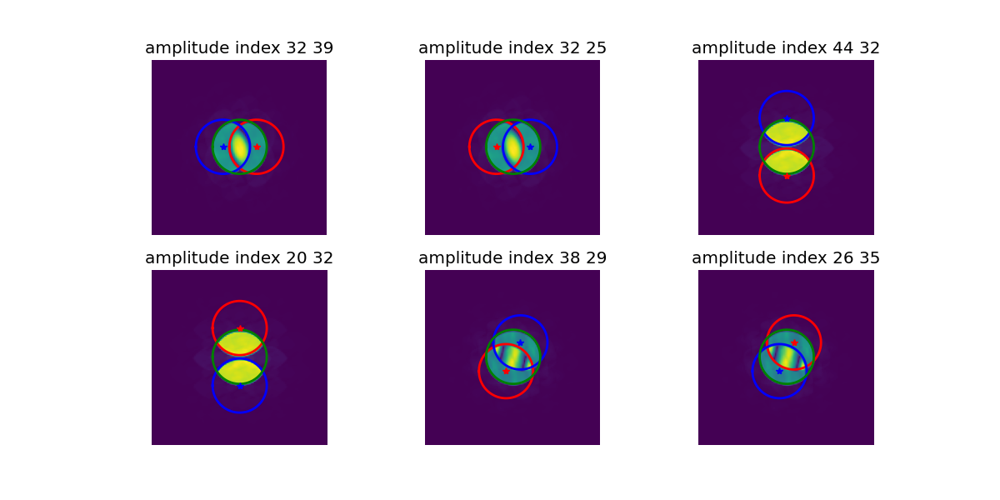

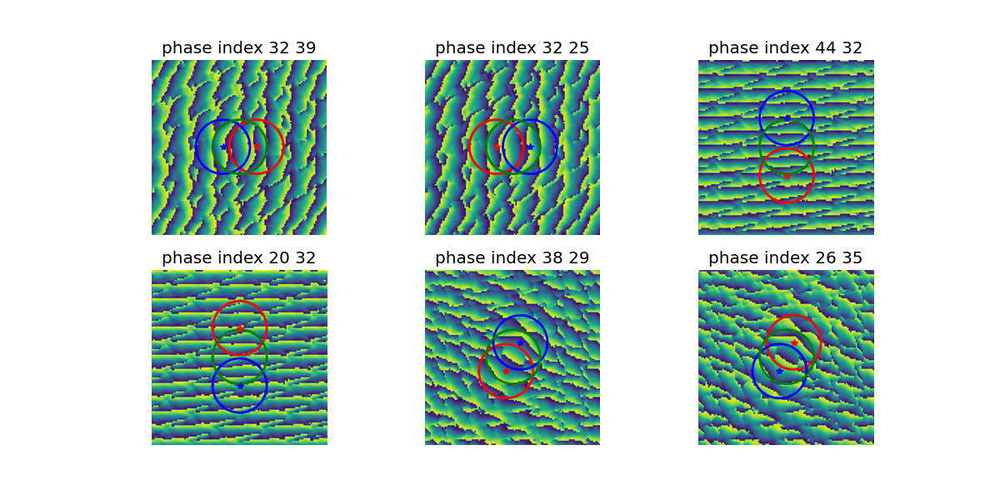

In [31]:
data_4D.plot_trotters()

In [32]:
ssb = SSB(data_4D)
ssb.run()

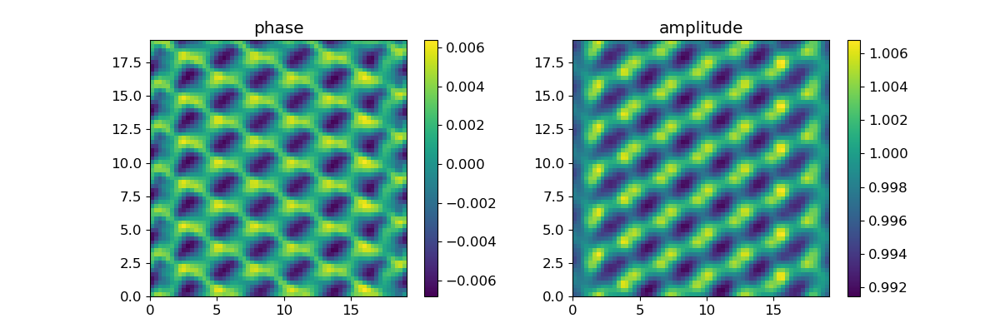

In [33]:
ssb.plot_result()

## Reconstruction at low-dose condition

In [35]:
filename = 'MoS2_80kV_25mrad_aberration free_dose 10000.npy'
filename = 'MoS2_80kV_25mrad_dose 10000.npy'
data = np.load(filename, allow_pickle=True).item()
parfile = {'aperture': data['aperture_size'], 
           'voltage': data['voltage'], 
           'stepsize': data['scan_step_size'], 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=data['data_4D'])
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

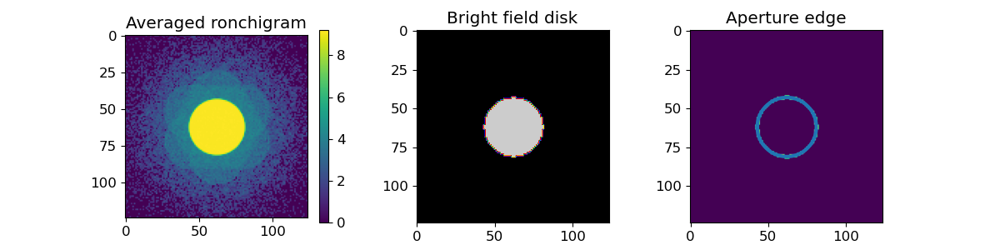

In [36]:
data_4D.plot_aperture()

In [37]:
data_4D.truncate_ronchigram(expansion_ratio=None)
data_4D.apply_FT()
data_4D.plot_4D_reciprocal_both()

<Signal2D, title: FT of 4D data, dimensions: (64, 64, 2|124, 124)>

/Users/test/clean_copy_most_recent/Songge_clean/STEM4D.py:187: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax =plt.subplots(rows,cols,figsize=figsize,num=num)


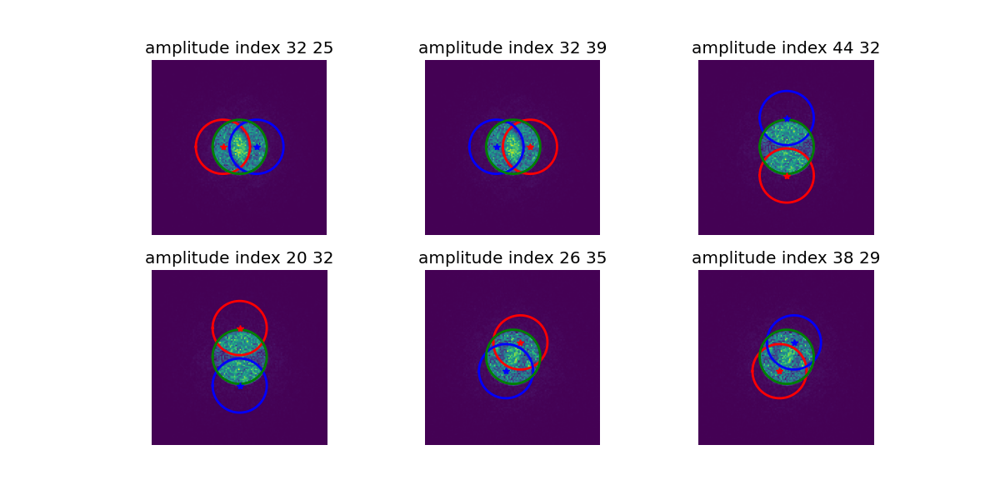

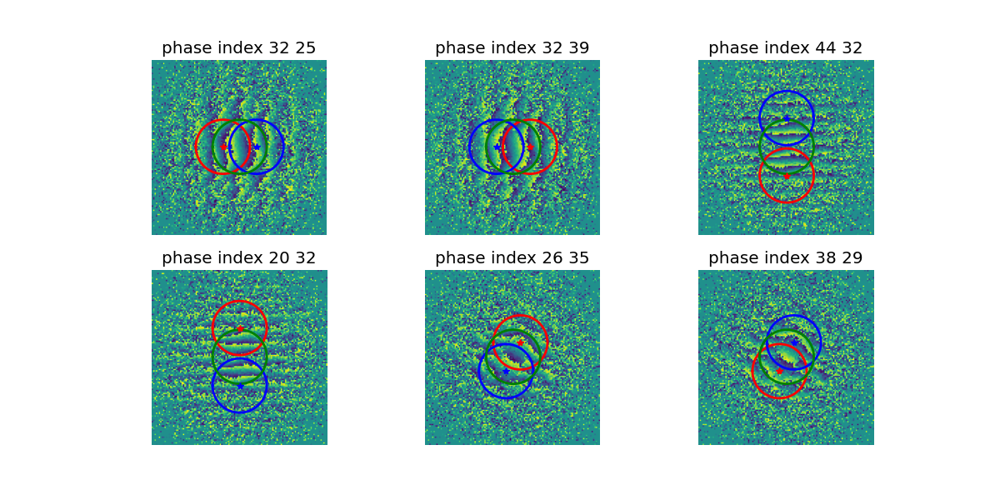

In [39]:
data_4D.remove_zero_frequency()
data_4D.plot_trotters()

In [40]:
ssb = SSB(data_4D)
ssb.run()

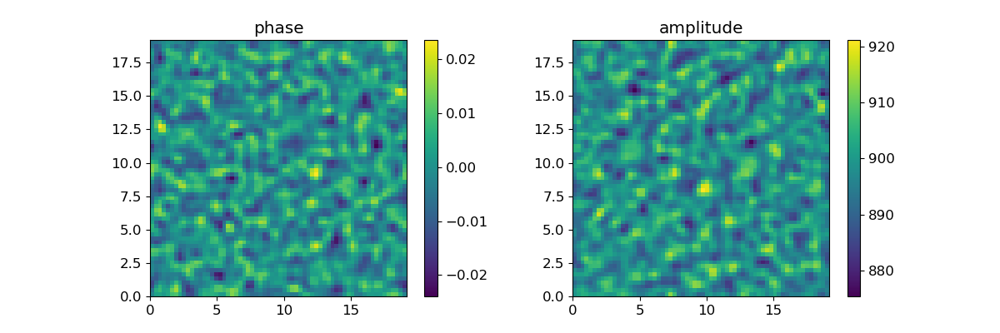

In [41]:
ssb.plot_result()

### Compare with ADF imaging

In [43]:
adf_filename = 'MoS2_ADF_80kV_25mrad_aberration free_dose 10000.npy'
adf_filename = 'MoS2_ADF_80kV_25mrad_dose 10000.npy'
data_adf = np.load(adf_filename, allow_pickle=True).item()
adf_image = data_adf['image']

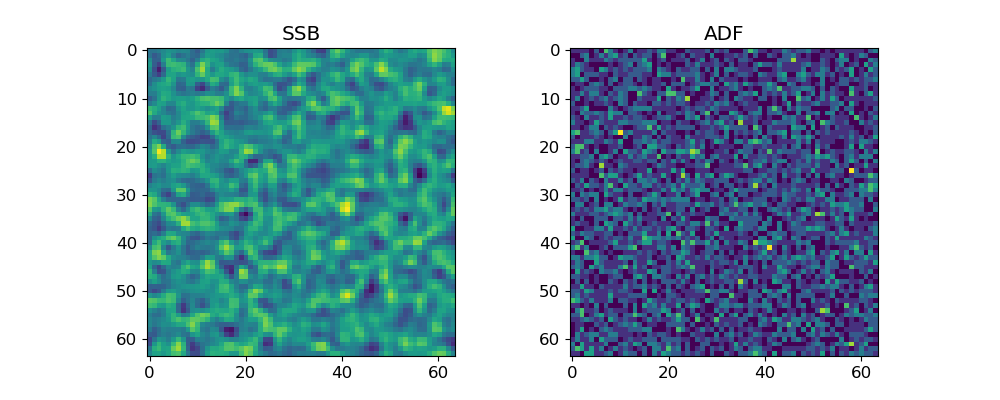

In [44]:
fig,ax =plt.subplots(1, 2, figsize=(10,4))
ax[0].imshow(ssb.phase)
ax[0].set_title('SSB')
ax[1].imshow(adf_image)  
ax[1].set_title('ADF')
plt.show()

## Aberration correction

<img src="ssb aberration correction.png" width="1000"/>

### Reconstruction without aberration correction

In [45]:
filename = 'MoS2_80kV_25mrad_dose 10000.npy'
data = np.load(filename, allow_pickle=True).item()
parfile = {'aperture': data['aperture_size'], 
           'voltage': data['voltage'], 
           'stepsize': data['scan_step_size'], 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=data['data_4D'])
# data_4D.bin_Q(bin_factor=2)
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

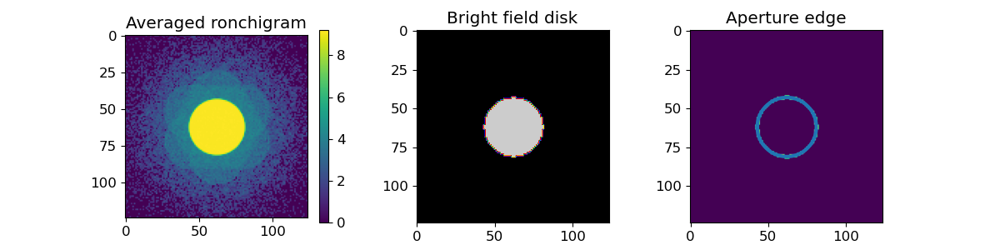

In [46]:
data_4D.plot_aperture()

In [47]:
data_4D.truncate_ronchigram(expansion_ratio=None)
data_4D.apply_FT()
data_4D.plot_4D_reciprocal_both()

<Signal2D, title: FT of 4D data, dimensions: (64, 64, 2|124, 124)>

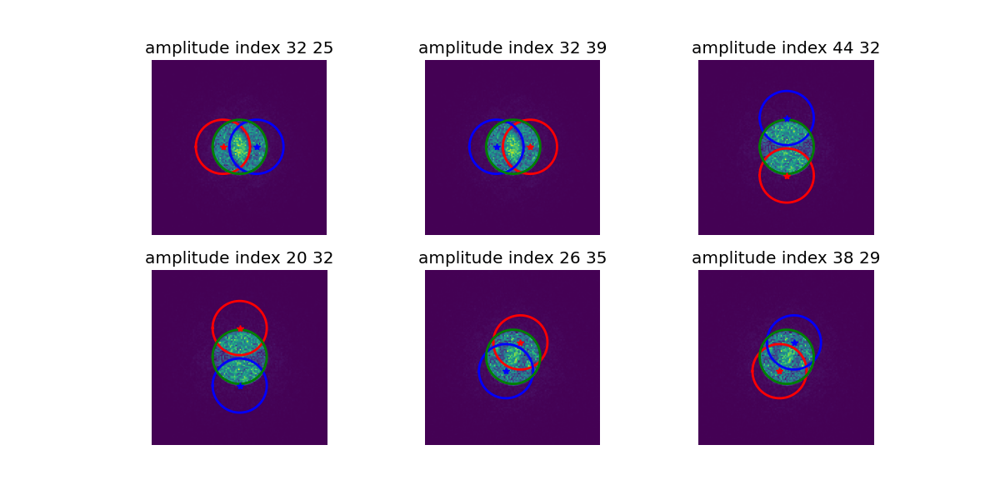

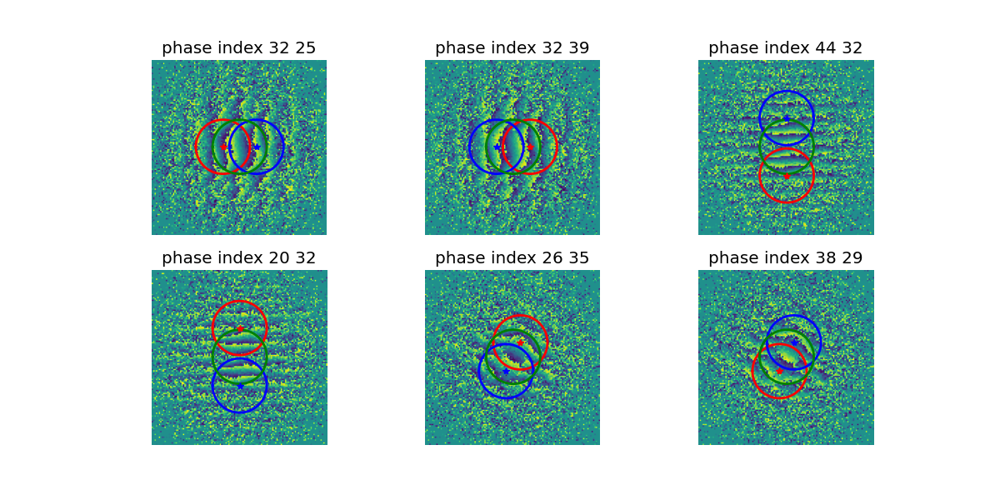

In [48]:
data_4D.remove_zero_frequency()
data_4D.plot_trotters()

In [49]:
ssb = SSB(data_4D)
ssb.run()

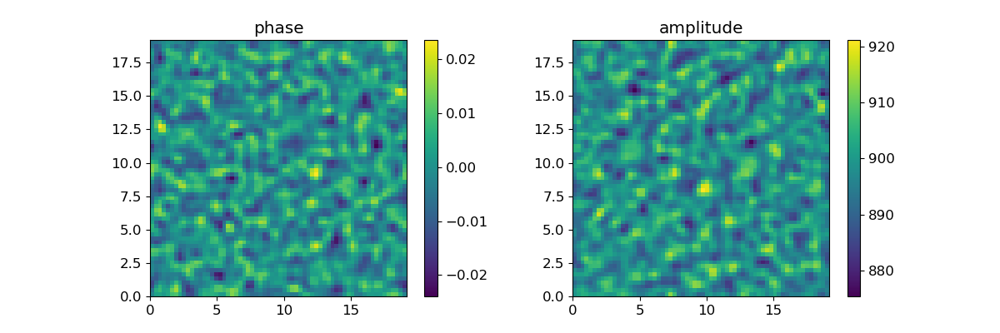

In [50]:
ssb.plot_result()

### Calculate aberration coefficients

In [51]:
svd = SVD_AC(data_4D, trotters_nb=6)
svd.find_trotters()

6 trotters found
trotter index: [[32, 25], [32, 39], [44, 32], [20, 32], [26, 35], [38, 29]]


In [52]:
aberration_coeffs = svd.run_svd(iterations=20, order=3, cf=0.5)
svd.print_aberration_coefficients(aberration_coeffs)

C10  =  10.535  nm
C12a =  -0.582  nm
C12b =  -1.698  nm
C21a =  9.918  nm
C21b =  3.157  nm
C23a =  -2.715  nm
C23b =  -0.103  nm
C30  =  20.0  um
C32a =  2.273  um
C32b =  9.179  um
C34a =  0.238  um
C34b =  -9.721  um
C41a =  0.0  mm
C41b =  0.0  mm
C43a =  0.0  mm
C43b =  0.0  mm
C45a =  0.0  mm
C45b =  0.0  mm
C50  =  0.0  mm
C52a =  0.0  mm
C52b =  0.0  mm
C54a =  0.0  mm
C54b =  0.0  mm
C56a =  0.0  mm
C56b =  0.0  mm


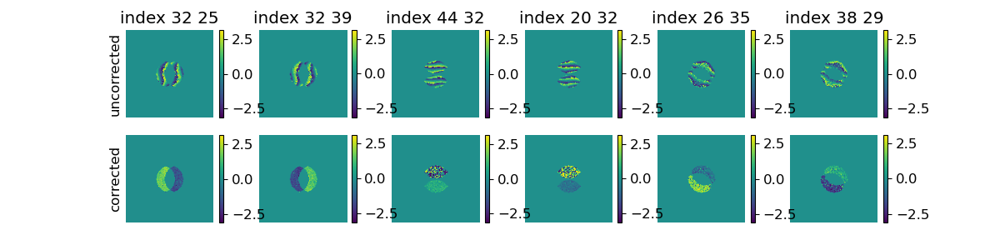

In [53]:
svd.plot_corrected_trotters(data_4D.selected_frames, svd.aberration_coeffs)

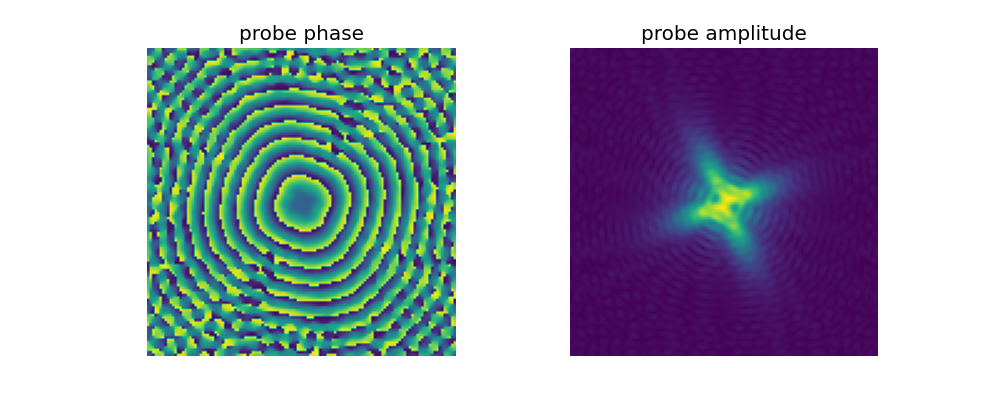

In [54]:
svd.calc_probefunction()
svd.plot_probe()

### Reconstruction after aberration correction

In [55]:
ssb_ac = SSB(data_4D)
ssb_ac.run(aberrations=svd.aberration_coeffs, order=3)

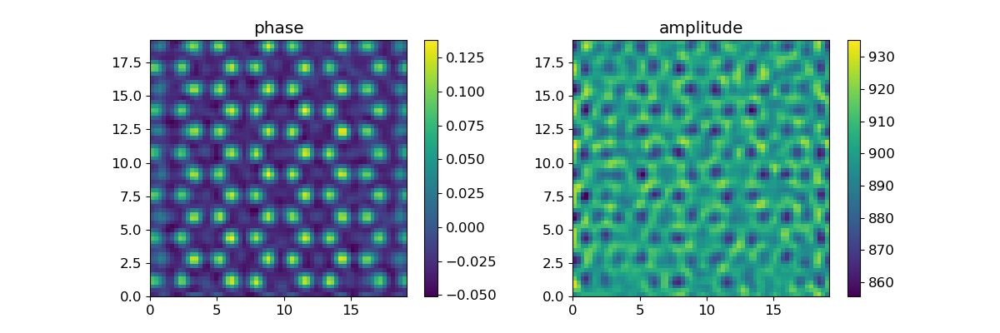

In [56]:
ssb_ac.plot_result()

In [57]:
# Saving reconstruction result
data_dict = {
    'SSB_object': ssb_ac.complex,
    'aberr_coeffs': svd.aberration_coeffs,
    'probe': svd.probe
}
filename = f"SSB_AC_{int(data['voltage'])}kV_{data['aperture_size']}rad_{int(data['dose'])}.npy"
np.save(filename, data_dict)

### Compare with ADF imaging

In [58]:
adf_filename = 'MoS2_ADF_80kV_25mrad_dose 10000.npy'
data_adf = np.load(adf_filename, allow_pickle=True).item()
adf_image = data_adf['image']

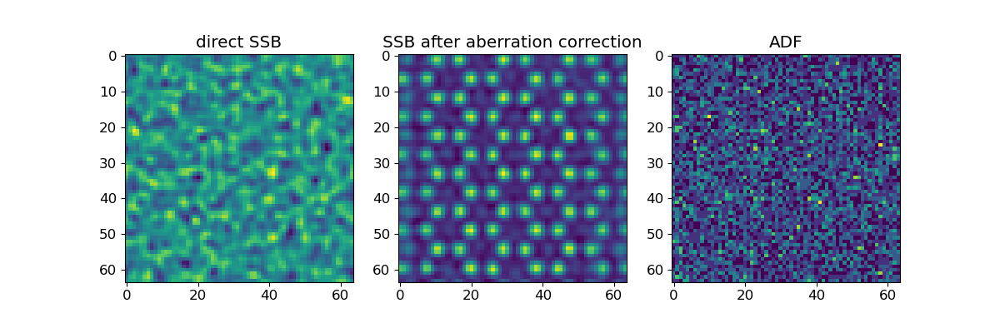

In [59]:
fig,ax =plt.subplots(1, 3, figsize=(12,4))
ax[0].imshow(ssb.phase)
ax[0].set_title('direct SSB')
ax[1].imshow(ssb_ac.phase)
ax[1].set_title('SSB after aberration correction')
ax[2].imshow(adf_image)  
ax[2].set_title('ADF')
plt.show()

# Wigner-Distribution Deconvolution (WDD) ptychography

In [60]:
import numpy as np
import matplotlib.pyplot as plt
from STEM4D import *
%matplotlib widget

## Reconstruct without aberrations correction

In [61]:
filename = 'MoS2_80kV_25mrad_dose 10000.npy'
data = np.load(filename, allow_pickle=True).item()
parfile = {'aperture': data['aperture_size'], 
           'voltage': data['voltage'], 
           'stepsize': data['scan_step_size'], 
           'threshold': 0.2}
data_4D = Data4D(parfile, data=data['data_4D'])
# data_4D.bin_Q(bin_factor=2)
data_4D.estimate_aperture_size()
data_4D.plot_4D()

{'aperture': 0.025, 'voltage': 80.0, 'stepsize': 0.3, 'threshold': 0.2}


<Signal2D, title: 4D data, dimensions: (64, 64|124, 124)>

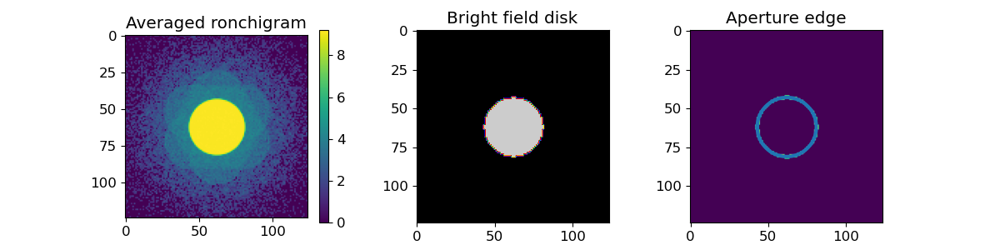

In [62]:
data_4D.plot_aperture()

In [63]:
data_4D.truncate_ronchigram(expansion_ratio=None)
data_4D.apply_FT()
data_4D.plot_4D_reciprocal_both()

<Signal2D, title: FT of 4D data, dimensions: (64, 64, 2|124, 124)>

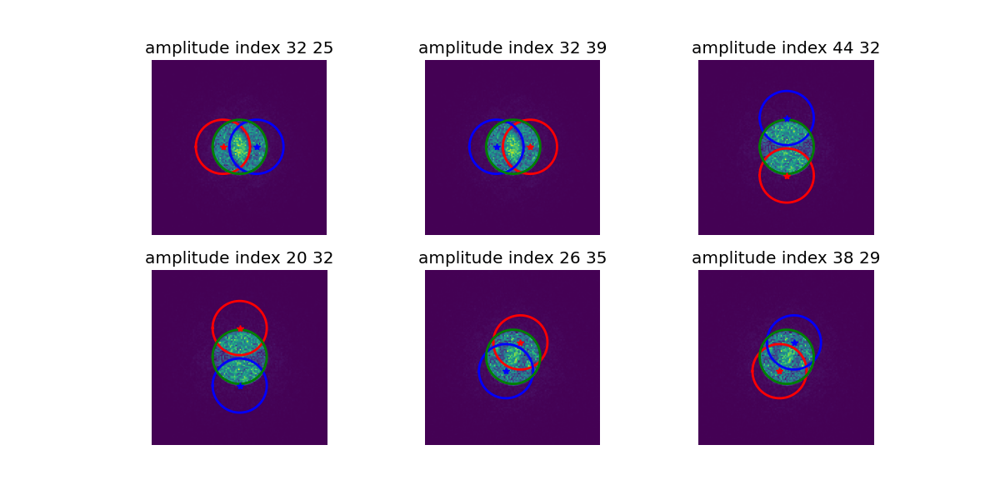

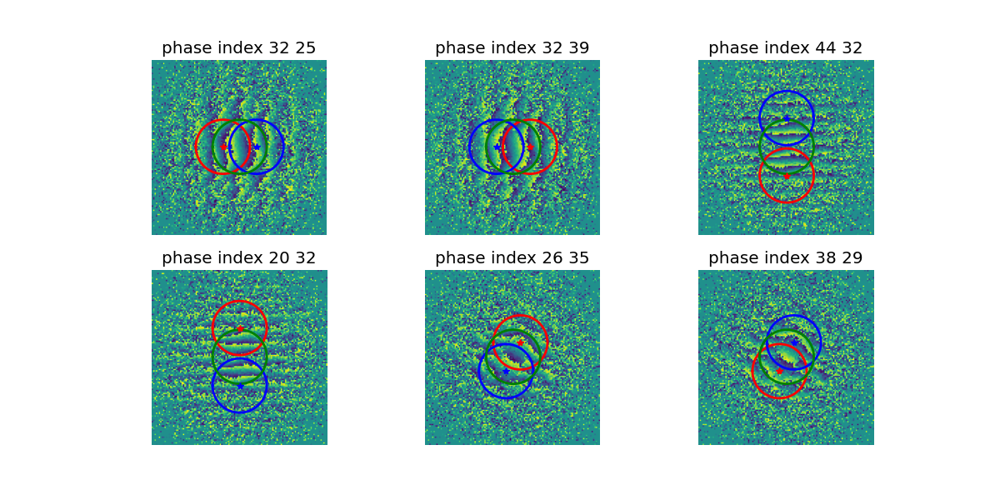

In [64]:
data_4D.remove_zero_frequency()
data_4D.plot_trotters()

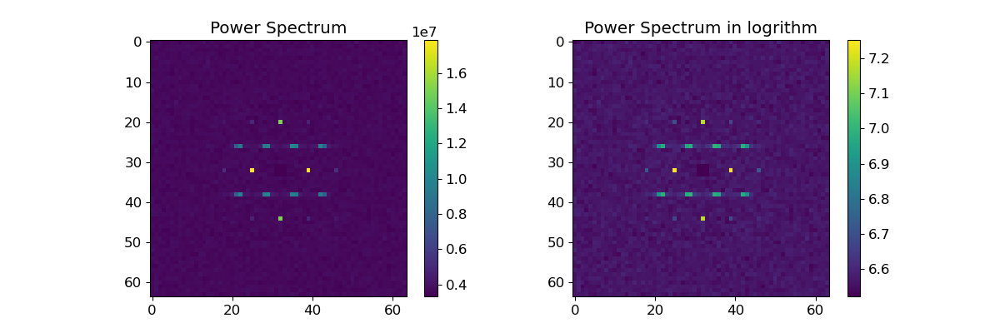

In [65]:
data_4D.plot_FT()

In [66]:
wdd = WDD(data_4D)
wdd.run()

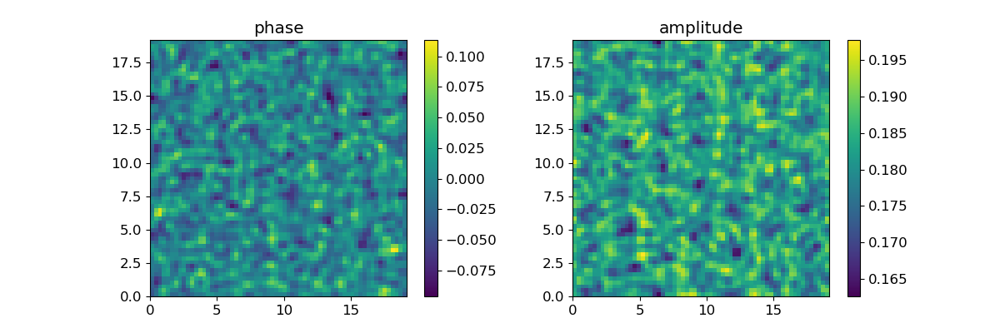

In [67]:
wdd.plot_result()

## Calculate aberration coefficients

In [68]:
svd = SVD_AC(data_4D, trotters_nb=6)
svd.find_trotters()

6 trotters found
trotter index: [[32, 25], [32, 39], [44, 32], [20, 32], [26, 35], [38, 29]]


In [69]:
aberration_coeffs = svd.run_svd(iterations=20, order=3, cf=0.5)
svd.print_aberration_coefficients(aberration_coeffs)

C10  =  10.535  nm
C12a =  -0.582  nm
C12b =  -1.698  nm
C21a =  9.918  nm
C21b =  3.157  nm
C23a =  -2.715  nm
C23b =  -0.103  nm
C30  =  20.0  um
C32a =  2.273  um
C32b =  9.179  um
C34a =  0.238  um
C34b =  -9.721  um
C41a =  0.0  mm
C41b =  0.0  mm
C43a =  0.0  mm
C43b =  0.0  mm
C45a =  0.0  mm
C45b =  0.0  mm
C50  =  0.0  mm
C52a =  0.0  mm
C52b =  0.0  mm
C54a =  0.0  mm
C54b =  0.0  mm
C56a =  0.0  mm
C56b =  0.0  mm


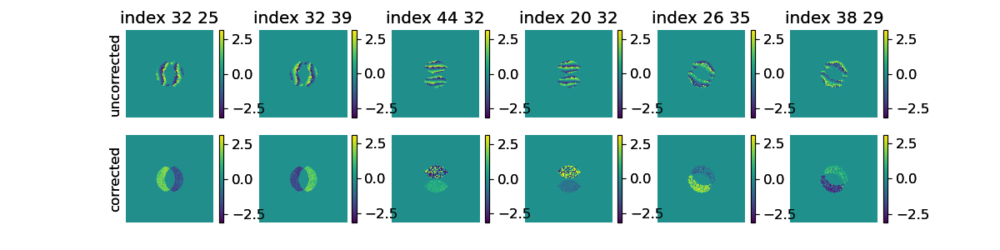

In [70]:
svd.plot_corrected_trotters(data_4D.selected_frames,svd.aberration_coeffs)

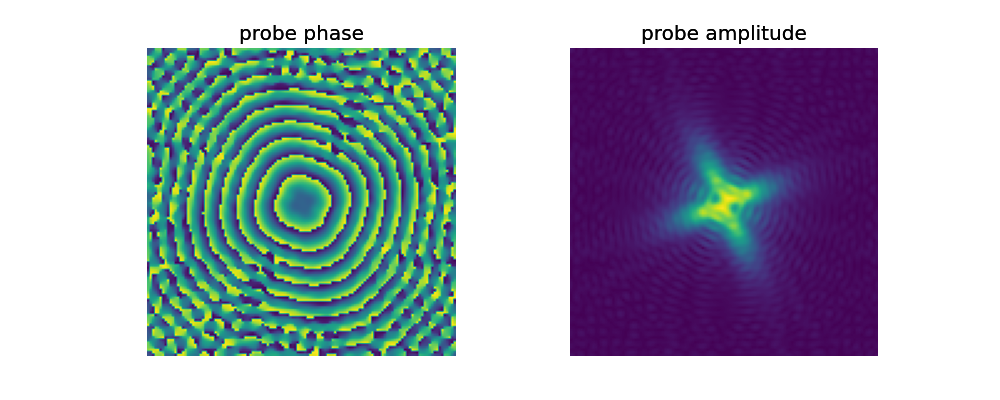

In [71]:
svd.calc_probefunction()
svd.plot_probe()

## Reconstruct after aberrations correction

In [72]:
wdd_ac = WDD(data_4D)
wdd_ac.run(aberrations=svd.aberration_coeffs)

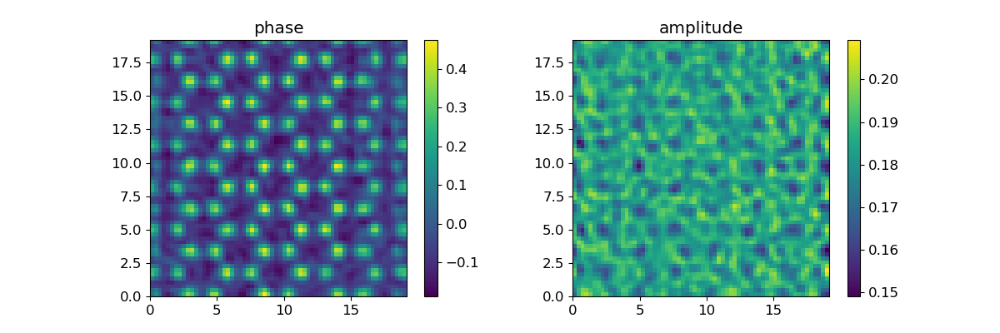

In [73]:
wdd_ac.plot_result()

In [74]:
# Saving reconstruction result
data_dict = {
    'WDD_object': wdd_ac.Obj_function,
    'aberr_coeffs': svd.aberration_coeffs,
    'probe': svd.probe
}
filename = f"WDD_AC_{int(data['voltage'])}kV_{data['aperture_size']}rad_{int(data['dose'])}.npy"
np.save(filename, data_dict)

## Compare with SSB

In [75]:
ssb_filename = 'SSB_AC_80kV_0.025rad_10000.npy'
data_ssb = np.load(ssb_filename, allow_pickle=True).item()
ssb_image = np.angle(data_ssb['SSB_object'])

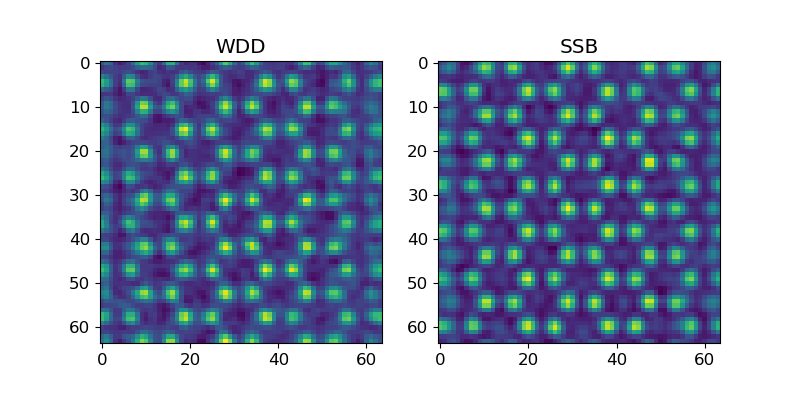

In [76]:
fig,ax =plt.subplots(1, 2, figsize=(8,4))
ax[0].imshow(wdd_ac.phase)
ax[0].set_title('WDD')
ax[1].imshow(ssb_image)
ax[1].set_title('SSB')
plt.show()